# Featurization Model Tuning Project

## Author: Abhinav Roy

### Date - 24/12/2022

In [113]:
# import the important packages
import pandas as pd #library used for data manipulation and analysis
import numpy as np # library used for working with arrays.
import matplotlib.pyplot as plt # library for plots and visualisations
import seaborn as sns # library for visualisations
import plotly.express as px # library for visualisations
%matplotlib inline
import missingno as msno

import scipy.stats as stats # this library contains a large number of probability distributions as well as a growing library of statistical functions.
from scipy.stats import *
from scipy.spatial.distance import cdist
from math import *

import pandasql as psql
from pandasql import sqldf

import string
alphabet = string.ascii_letters+string.punctuation

from mpl_toolkits.mplot3d import Axes3D

from patsy import dmatrices
from statsmodels.stats.outliers_influence import variance_inflation_factor

import time
from datetime import datetime

from collections import Counter

import pickle

import warnings # ignore warnings
warnings.filterwarnings("ignore")

In [114]:
# import machine learning algorithms
from sklearn.preprocessing import LabelEncoder, MinMaxScaler, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn import metrics
#from sklearn.metrics import classification_report, confusion_matrix , accuracy_score
from sklearn.metrics import *
from sklearn import model_selection
#from sklearn.model_selection import cross_val_score, cross_validate, GridSearchCV, learning_curve
from sklearn.model_selection import *
from sklearn.linear_model import LinearRegression, LogisticRegression, Ridge, Lasso
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier
from sklearn.ensemble import BaggingRegressor, RandomForestRegressor, GradientBoostingRegressor
from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor
from xgboost import XGBClassifier, XGBRegressor
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

# install and import SMOTE module from imblearn library
#!pip install imblearn
from imblearn.over_sampling import RandomOverSampler, SMOTENC, SMOTE

#!pip install eli5
import eli5

•	DOMAIN:   Semiconductor manufacturing process
•	CONTEXT: A complex modern semiconductor manufacturing process is normally under constant surveillance via the monitoring of signals/variables collected from sensors and or process measurement points. However, not all of these signals are equally valuable in a specific monitoring system. The measured signals contain a combination of useful information, irrelevant information as well as noise. Engineers typically have a much larger number of signals than are actually required. If we consider each type of signal as a feature, then feature selection may be applied to identify the most relevant signals. The Process Engineers may then use these signals to determine key factors contributing to yield excursions downstream in the process. This will enable an increase in process throughput, decreased time to learning and reduce the per unit production costs. These signals can be used as features to predict the yield type. And by analysing and trying out different combinations of features, essential signals that are impacting the yield type can be identified.
•	DATA DESCRIPTION: sensor-data.csv : (1567, 592)
The data consists of 1567 datapoints each with 591 features.
The dataset presented in this case represents a selection of such features where each example represents a single production entity with associated measured features and the labels represent a simple pass/fail yield for in house line testing. Target column “ –1” corresponds to a pass and “1” corresponds to a fail and the data time stamp is for that specific test point.
•	PROJECT OBJECTIVE: We will build a classifier to predict the Pass/Fail yield of a particular process entity and analyse whether all the features are required to build the model or not.
Steps and tasks: [ Total Score: 60 points]
1.	Import and understand the data. [5 Marks]
A.	Import ‘signal-data.csv’ as DataFrame. [2 Marks]
B.	Print 5 point summary and share at least 2 observations. [3 Marks]
2.	Data cleansing: [15 Marks]
A.	Write a for loop which will remove all the features with 20%+ Null values and impute rest with mean of the feature. [5 Marks]
B.	Identify and drop the features which are having same value for all the rows. [3 Marks]
C.	Drop other features if required using relevant functional knowledge. Clearly justify the same. [2 Marks]
D.	Check for multi-collinearity in the data and take necessary action. [3 Marks]
E.	Make all relevant modifications on the data using both functional/logical reasoning/assumptions. [2 Marks]
3.	Data analysis & visualisation: [5 Marks]
A.	Perform a detailed univariate Analysis with appropriate detailed comments after each analysis. [2 Marks]
B.	Perform bivariate and multivariate analysis with appropriate detailed comments after each analysis. [3 Marks]
4.	Data pre-processing: [10 Marks]
A.	Segregate predictors vs target attributes. [2 Marks]
B.	Check for target balancing and fix it if found imbalanced. [3 Marks]
C.	Perform train-test split and standardise the data or vice versa if required. [3 Marks]
D.	Check if the train and test data have similar statistical characteristics when compared with original data. [2 Marks]
5.	Model training, testing and tuning: [20 Marks]
A.	Use any Supervised Learning technique to train a model. [2 Marks]
B.	Use cross validation techniques. [3 Marks]
Hint: Use all CV techniques that you have learnt in the course.
C.	Apply hyper-parameter tuning techniques to get the best accuracy. [3 Marks]
Suggestion: Use all possible hyper parameter combinations to extract the best accuracies.
D.	Use any other technique/method which can enhance the model performance. [4 Marks]
Hint: Dimensionality reduction, attribute removal, standardisation/normalisation, target balancing etc.
E.	Display and explain the classification report in detail. [3 Marks]
F.	Apply the above steps for all possible models that you have learnt so far. [5 Marks]
6.	Post Training and Conclusion: [5 Marks]
A.	Display and compare all the models designed with their train and test accuracies. [1 Marks]
B.	Select the final best trained model along with your detailed comments for selecting this model. [1 Marks]
C.	Pickle the selected model for future use. [2 Marks]
D.	Write your conclusion on the results. [1 Marks]

## 1.	Import and understand the data. 

In [115]:
# A.	Import ‘signal-data.csv’ as DataFrame.
df = pd.read_csv("signal-data.csv")
df.head()

,Time,0,1,2,3,4,5,6,7,8,...,581,582,583,584,585,586,587,588,589,Pass/Fail
0,2008-07-19 11:55:00,3030.93,2564.00,2187.7333,1411.1265,1.3602,100.0,97.6133,0.1242,1.5005,...,NaN,0.5005,0.0118,0.0035,2.3630,NaN,NaN,NaN,NaN,-1
1,2008-07-19 12:32:00,3095.78,2465.14,2230.4222,1463.6606,0.8294,100.0,102.3433,0.1247,1.4966,...,208.2045,0.5019,0.0223,0.0055,4.4447,0.0096,0.0201,0.0060,208.2045,-1
2,2008-07-19 13:17:00,2932.61,2559.94,2186.4111,1698.0172,1.5102,100.0,95.4878,0.1241,1.4436,...,82.8602,0.4958,0.0157,0.0039,3.1745,0.0584,0.0484,0.0148,82.8602,1
3,2008-07-19 14:43:00,2988.72,2479.90,2199.0333,909.7926,1.3204,100.0,104.2367,0.1217,1.4882,...,73.8432,0.4990,0.0103,0.0025,2.0544,0.0202,0.0149,0.0044,73.8432,-1
4,2008-07-19 15:22:00,3032.24,2502.87,2233.3667,1326.5200,1.5334,100.0,100.3967,0.1235,1.5031,...,NaN,0.4800,0.4766,0.1045,99.3032,0.0202,0.0149,0.0044,73.8432,-1


In [116]:
# dataframe df shape
df.shape

(1567, 592)

In [117]:
# dataframe df information
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1567 entries, 0 to 1566
Columns: 592 entries, Time to Pass/Fail
dtypes: float64(590), int64(1), object(1)
memory usage: 7.1+ MB


In [118]:
# B.	Print 5 point summary and share at least 2 observations
df.describe().T

,count,mean,std,min,25%,50%,75%,max
0,1561.0,3014.452896,73.621787,2743.2400,2966.260000,3011.4900,3056.6500,3356.3500
1,1560.0,2495.850231,80.407705,2158.7500,2452.247500,2499.4050,2538.8225,2846.4400
2,1553.0,2200.547318,29.513152,2060.6600,2181.044400,2201.0667,2218.0555,2315.2667
3,1553.0,1396.376627,441.691640,0.0000,1081.875800,1285.2144,1591.2235,3715.0417
4,1553.0,4.197013,56.355540,0.6815,1.017700,1.3168,1.5257,1114.5366
...,...,...,...,...,...,...,...,...
586,1566.0,0.021458,0.012358,-0.0169,0.013425,0.0205,0.0276,0.1028
587,1566.0,0.016475,0.008808,0.0032,0.010600,0.0148,0.0203,0.0799
588,1566.0,0.005283,0.002867,0.0010,0.003300,0.0046,0.0064,0.0286
589,1566.0,99.670066,93.891919,0.0000,44.368600,71.9005,114.7497,737.3048


#### Observations:

1) Many of the features like 0, 1, 2, 3 have mean equal to the median, showing close to a normal distribution.

2) Many of the features like 0, 1, 2, 3 have values close to the mean +- 3 standard deviations indicating close to a normal distribution.

## 2.	Data cleansing

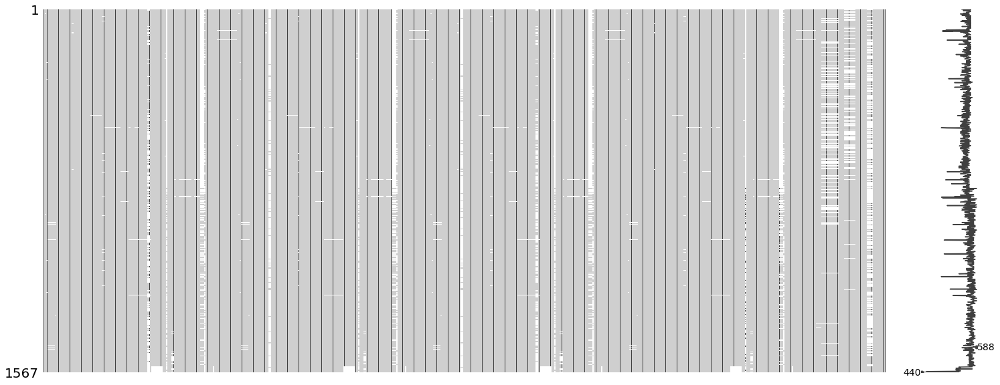

In [119]:
msno.matrix(df);

#### Observations:

1) The blank spaces in the matrix indicates that their are missing values in the dataset

In [120]:
df1 = df.copy(deep = True)

In [121]:
# A.	Write a for loop which will remove all the features with 20%+ Null values and impute rest with mean of the feature. 
def remove_nulls(df):
    print('Dataframe shape before removing Nulls:', df.shape)
    print('*' * 50)
    
    filter_cols = df.columns[df.isna().mean() > 0.2]
    print('Number of features with 20%+ Null values:', filter_cols.shape[0])
    print('*' * 50)
    
    for i in filter_cols:
        df.drop(i, axis = 1, inplace = True)
        
    num_cols = df.select_dtypes(exclude = 'object').columns.to_list()
    df[num_cols] = df[num_cols].astype('float')
    df[num_cols] = df[num_cols].fillna(df[num_cols].mean())
    
    print('Dataframe shape after removing Nulls:', df.shape)
    print('*' * 50)
    print('Dataframe 5-point summary:')
    return df.describe().T

In [122]:
remove_nulls(df1)

Dataframe shape before removing Nulls: (1567, 592)
**************************************************
Number of features with 20%+ Null values: 32
**************************************************
Dataframe shape after removing Nulls: (1567, 560)
**************************************************
Dataframe 5-point summary:


,count,mean,std,min,25%,50%,75%,max
0,1567.0,3014.452896,73.480613,2743.2400,2966.66500,3011.8400,3056.5400,3356.3500
1,1567.0,2495.850231,80.227793,2158.7500,2452.88500,2498.9100,2538.7450,2846.4400
2,1567.0,2200.547318,29.380932,2060.6600,2181.09995,2200.9556,2218.0555,2315.2667
3,1567.0,1396.376627,439.712852,0.0000,1083.88580,1287.3538,1590.1699,3715.0417
4,1567.0,4.197013,56.103066,0.6815,1.01770,1.3171,1.5296,1114.5366
...,...,...,...,...,...,...,...,...
586,1567.0,0.021458,0.012354,-0.0169,0.01345,0.0205,0.0276,0.1028
587,1567.0,0.016475,0.008805,0.0032,0.01060,0.0148,0.0203,0.0799
588,1567.0,0.005283,0.002866,0.0010,0.00330,0.0046,0.0064,0.0286
589,1567.0,99.670066,93.861936,0.0000,44.36860,72.0230,114.7497,737.3048


In [123]:
# B.	Identify and drop the features which are having same value for all the rows. 
def rem_const_feats(df):
    print('Dataframe shape before dropping features with constant values:', df.shape)
    print('*' * 50)
    
    num_cols = df.select_dtypes(exclude = 'object').columns.to_list()
    std = df[num_cols].std()
    cols_to_drop = std[std == 0].index
    print('Number of features with constant values:', cols_to_drop.shape[0])
    print('*' * 100)
    
    df.drop(cols_to_drop, axis = 1, inplace = True)    
    print('Dataframe shape after dropping features with constant values:', df.shape)

In [124]:
rem_const_feats(df1)

Dataframe shape before dropping features with constant values: (1567, 560)
**************************************************
Number of features with constant values: 116
****************************************************************************************************
Dataframe shape after dropping features with constant values: (1567, 444)


In [125]:
# C.	Drop other features if required using relevant functional knowledge. Clearly justify the same.
# E.	Make all relevant modifications on the data using both functional/logical reasoning/assumptions
# Drop feature Time from dataset
def mod_time_feature(df):
    from datetime import datetime
    df['year'] = pd.DatetimeIndex(df['Time']).year
    df['month'] = pd.DatetimeIndex(df['Time']).month
    df['date'] = pd.DatetimeIndex(df['Time']).day
    df['week_day'] = pd.DatetimeIndex(df['Time']).weekday
    df['start_time'] = pd.DatetimeIndex(df['Time']).time
    df['hour'] = pd.DatetimeIndex(df['Time']).hour
    df['min'] = pd.DatetimeIndex(df['Time']).minute
    df.drop('Time', axis = 1, inplace = True) # C.	Drop other features if required using relevant functional knowledge.
    
    return df.head()

In [126]:
mod_time_feature(df1)

,0,1,2,3,4,6,7,8,9,10,...,588,589,Pass/Fail,year,month,date,week_day,start_time,hour,min
0,3030.93,2564.00,2187.7333,1411.1265,1.3602,97.6133,0.1242,1.5005,0.0162,-0.0034,...,0.005283,99.670066,-1.0,2008,7,19,5,11:55:00,11,55
1,3095.78,2465.14,2230.4222,1463.6606,0.8294,102.3433,0.1247,1.4966,-0.0005,-0.0148,...,0.006000,208.204500,-1.0,2008,7,19,5,12:32:00,12,32
2,2932.61,2559.94,2186.4111,1698.0172,1.5102,95.4878,0.1241,1.4436,0.0041,0.0013,...,0.014800,82.860200,1.0,2008,7,19,5,13:17:00,13,17
3,2988.72,2479.90,2199.0333,909.7926,1.3204,104.2367,0.1217,1.4882,-0.0124,-0.0033,...,0.004400,73.843200,-1.0,2008,7,19,5,14:43:00,14,43
4,3032.24,2502.87,2233.3667,1326.5200,1.5334,100.3967,0.1235,1.5031,-0.0031,-0.0072,...,0.004400,73.843200,-1.0,2008,7,19,5,15:22:00,15,22


#### Observations:

1) Deriving features from the "Time" feature to check on possible correlation with other independent features.

2) Dropping the feature "Time" since it is not useful in model training.

In [127]:
# D. Check for multi-collinearity in the data and take necessary action. 
# Create correlation matrix
def drop_corr_feat(df):    
    row, column = df.shape
    print('Before dropping the correlated variables the dataset contains', row, 'rows and', column, 'columns')
    print('*' * 100)
    
    corr_matrix = df.corr().abs()

    # Select upper triangle of correlation matrix
    upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k = 1).astype(np.bool))
    
    # Find features with correlation greater than 0.70
    to_drop = [column for column in upper.columns if any(upper[column] > 0.70)]
    
    # Drop features 
    df.drop(to_drop, axis = 1, inplace = True)
    
    row, column = df.shape
    print('After dropping the correlated variables the dataset contains', row, 'rows and', column, 'columns')

In [128]:
drop_corr_feat(df1)

Before dropping the correlated variables the dataset contains 1567 rows and 450 columns
****************************************************************************************************
After dropping the correlated variables the dataset contains 1567 rows and 209 columns


## 3.	Data analysis & visualisation: 

#### Bivariate analysis

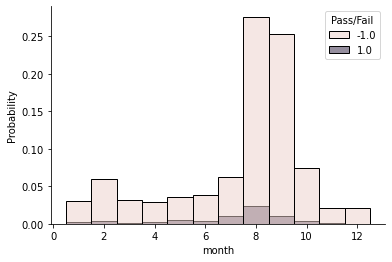

In [129]:
sns.histplot(data = df1, x = "month", hue = "Pass/Fail", stat = "probability", discrete = True,);
sns.despine(right = True, top = True)

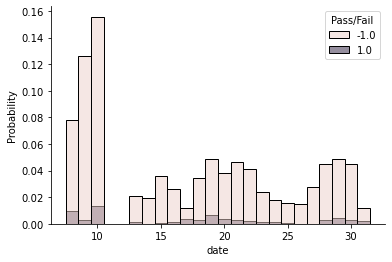

In [130]:
sns.histplot(data = df1, x = "date", hue = "Pass/Fail", stat = "probability", discrete = True,);
sns.despine(right = True, top = True)

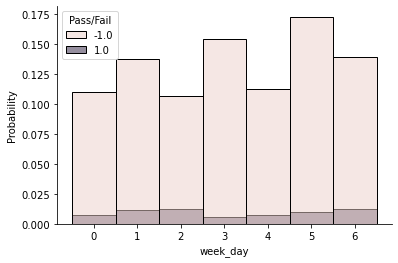

In [131]:
sns.histplot(data = df1, x = "week_day", hue = "Pass/Fail", stat = "probability", discrete = True,);
sns.despine(right = True, top = True)

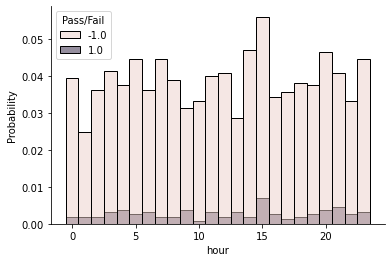

In [132]:
sns.histplot(data = df1, x = "hour", hue = "Pass/Fail", stat = "probability", discrete = True,);
sns.despine(right = True, top = True)

#### Observations:

1) This is a 24/7 around the clock production facility working on all days of the year and no significant pattern can be seen as such on a daily basis, except end of the weekday has a slightly higher value than most days.

2) Usually the first 10 days of every month is the busiest.

3) The production facility seems to be the busiest during the months of August and September, the abnormally high volumes can be a market response of the product.

4) These explorations help us understand the profile of the facility but do not provide significant insight into why a semiconductor failed in the production cyle. The distribution of success to failure follows the same distribution whether we analyse it hourly/daily/monthly or over the period of the entire year of 2008.Therefore we can drop these features.

In [133]:
# Dropping the derived features from the dataframe
df1.drop(['year','month','date','week_day','start_time','hour','min'], axis = 1, inplace = True)

In [134]:
df1.head()

,0,1,2,3,4,6,7,8,9,10,...,565,570,571,572,582,583,586,587,589,Pass/Fail
0,3030.93,2564.00,2187.7333,1411.1265,1.3602,97.6133,0.1242,1.5005,0.0162,-0.0034,...,0.14561,533.8500,2.1113,8.95,0.5005,0.0118,0.021458,0.016475,99.670066,-1.0
1,3095.78,2465.14,2230.4222,1463.6606,0.8294,102.3433,0.1247,1.4966,-0.0005,-0.0148,...,0.14561,535.0164,2.4335,5.92,0.5019,0.0223,0.009600,0.020100,208.204500,-1.0
2,2932.61,2559.94,2186.4111,1698.0172,1.5102,95.4878,0.1241,1.4436,0.0041,0.0013,...,0.62190,535.0245,2.0293,11.21,0.4958,0.0157,0.058400,0.048400,82.860200,1.0
3,2988.72,2479.90,2199.0333,909.7926,1.3204,104.2367,0.1217,1.4882,-0.0124,-0.0033,...,0.16300,530.5682,2.0253,9.33,0.4990,0.0103,0.020200,0.014900,73.843200,-1.0
4,3032.24,2502.87,2233.3667,1326.5200,1.5334,100.3967,0.1235,1.5031,-0.0031,-0.0072,...,0.14561,532.0155,2.0275,8.83,0.4800,0.4766,0.020200,0.014900,73.843200,-1.0


#### Univariate analysis

In [135]:
# A.	Perform a detailed univariate Analysis with appropriate detailed comments after each analysis. 

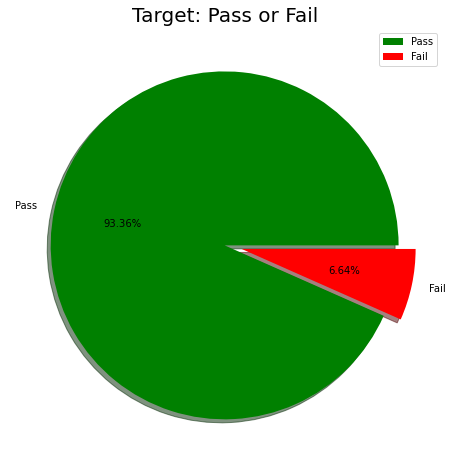

In [136]:
labels = ['Pass', 'Fail']
size = df1['Pass/Fail'].value_counts()
colors = ['Green', 'Red']
explode = [0, 0.1]

plt.style.use('seaborn-deep')
plt.rcParams['figure.figsize'] = (8, 8)
plt.pie(size, labels = labels, colors = colors, explode = explode, autopct = "%.2f%%", shadow = True)
plt.axis('off')
plt.title('Target: Pass or Fail', fontsize = 20)
plt.legend()
plt.show();

#### Observations:

1) We can see a significant target imbalance in the dataset.

2) The sensors failure intances are a total of only 6.64% of the entire target.

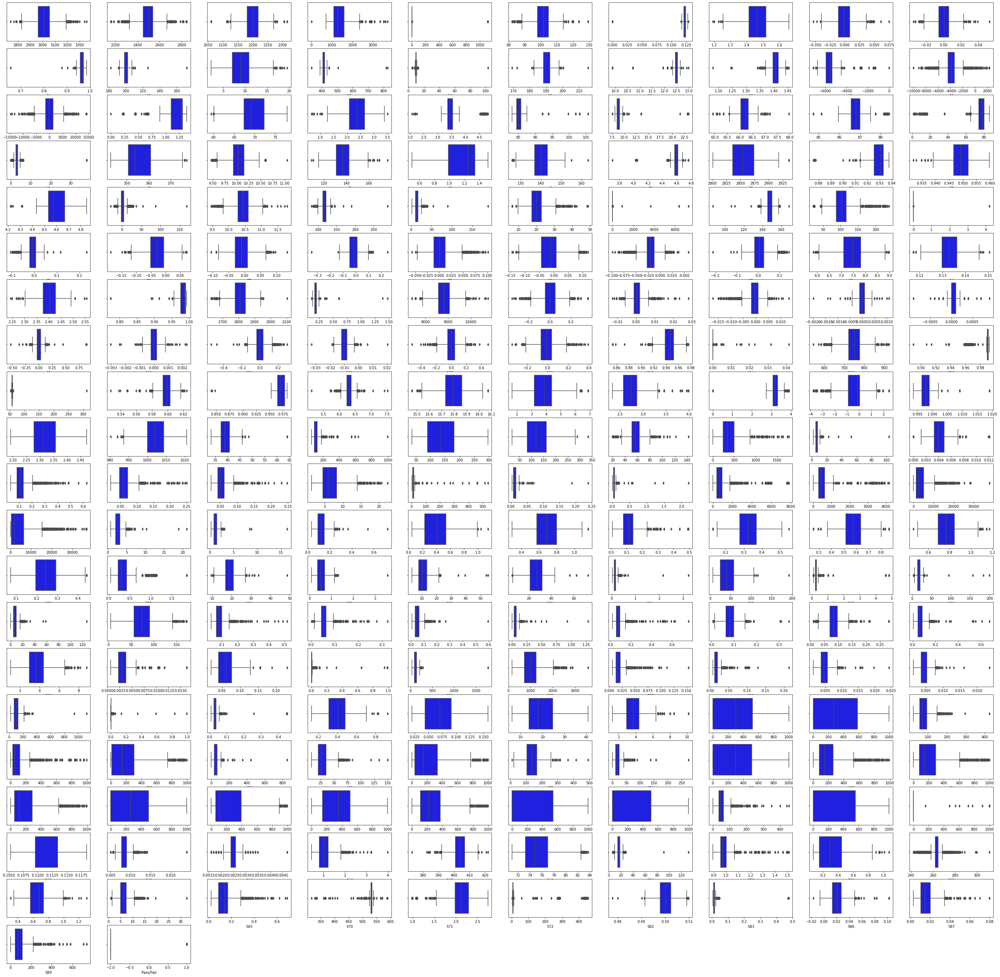

In [137]:
#Boxplot to check for outliers
plt.figure(figsize=(50, 50))
col = 1
for i in df1.columns:
    plt.subplot(21, 10, col)
    sns.boxplot(df1[i], color = 'blue')
    col += 1

In [138]:
# finding the outliers and replacing them by median
for i in df1.columns[:-1]:
    q1 = df1[i].quantile(0.25)
    q3 = df1[i].quantile(0.75)
    iqr = q3 - q1
    
    low = q1 - 1.5 * iqr
    high = q3 + 1.5 * iqr
    
    df1.loc[(df1[i] < low) | (df1[i] > high), i] = df1[i].median()

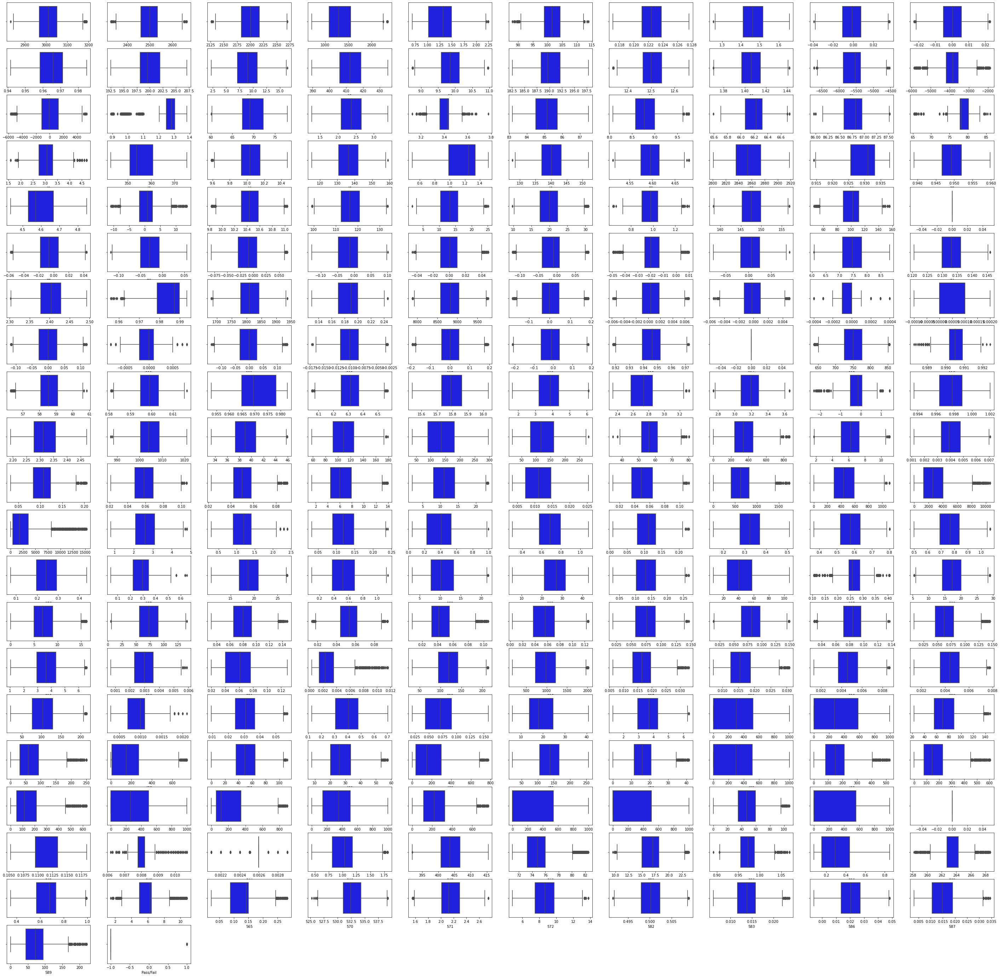

In [139]:
#Boxplot to check for outliers
plt.figure(figsize=(50, 50))
col = 1
for i in df1.columns:
    plt.subplot(21, 10, col)
    sns.boxplot(df1[i], color = 'blue')
    col += 1

#### Observations:

1) We have removed most of the outliers from the features.

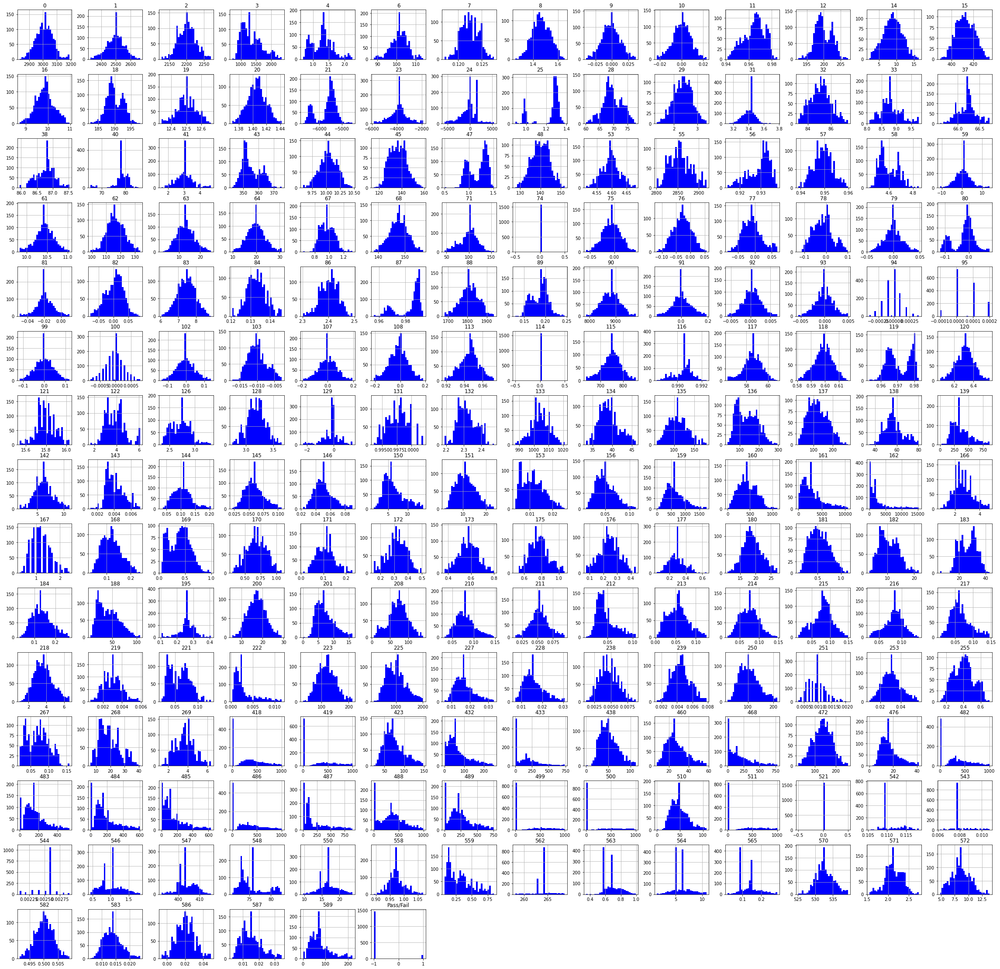

In [140]:
#plotting histogram to check for the frequency of values within a variable
df1.hist(bins = 30, figsize = (40, 40), color = 'blue')
plt.show()

#### Observations:

1) Most of the features display a Normal distribution.

#### Multivariate analysis

In [141]:
# B.	Perform bivariate and multivariate analysis with appropriate detailed comments after each analysis. 

In [142]:
# Pairplot for all features
#sns.pairplot(df1, corner = True);

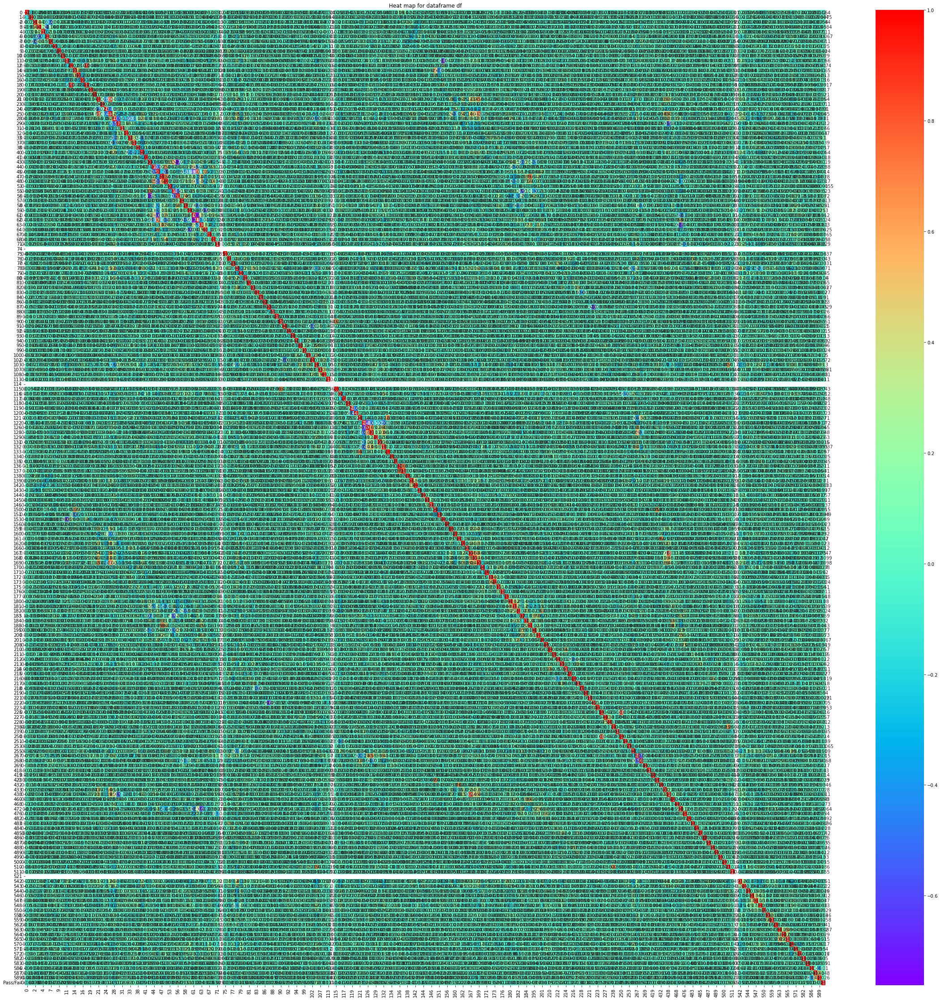

In [143]:
# Heatmap to get correlation
# Plotting the heat map for dataframe df
plt.figure(figsize = (40, 40))
plt.title('Heat map for dataframe df')
sns.heatmap(df1.corr(), annot = True, cmap = 'rainbow');

#### Observations:

1) From the heatmap we can observe that most of the sensors have moderate to weak correlation with each other and are therefore independent of each other which is important to build a good model.

## 4.	Data pre-processing: 

In [144]:
df2 = df1.copy(deep = True)
df2.head()

,0,1,2,3,4,6,7,8,9,10,...,565,570,571,572,582,583,586,587,589,Pass/Fail
0,3030.93,2564.00,2187.7333,1411.1265,1.3602,97.6133,0.1242,1.5005,0.0162,-0.0034,...,0.14561,533.8500,2.1113,8.95,0.5005,0.0118,0.021458,0.016475,99.670066,-1.0
1,3095.78,2465.14,2230.4222,1463.6606,0.8294,102.3433,0.1247,1.4966,-0.0005,-0.0148,...,0.14561,535.0164,2.4335,5.92,0.5019,0.0223,0.009600,0.020100,208.204500,-1.0
2,2932.61,2559.94,2186.4111,1698.0172,1.5102,95.4878,0.1241,1.4436,0.0041,0.0013,...,0.14280,535.0245,2.0293,11.21,0.4958,0.0157,0.020500,0.014800,82.860200,1.0
3,2988.72,2479.90,2199.0333,909.7926,1.3204,104.2367,0.1217,1.4882,-0.0124,-0.0033,...,0.16300,530.5682,2.0253,9.33,0.4990,0.0103,0.020200,0.014900,73.843200,-1.0
4,3032.24,2502.87,2233.3667,1326.5200,1.5334,100.3967,0.1235,1.5031,-0.0031,-0.0072,...,0.14561,532.0155,2.0275,8.83,0.5002,0.0138,0.020200,0.014900,73.843200,-1.0


In [145]:
# Scale the data
df_scaled = df2.apply(zscore)

In [146]:
# Checking for Null values after scaling
df_scaled.isna().any().sum()

3

In [147]:
# Checking for Null rows after scaling
df_scaled[df_scaled.isna().any(axis=1)]

,0,1,2,3,4,6,7,8,9,10,...,565,570,571,572,582,583,586,587,589,Pass/Fail
0,0.339170,1.125185,-0.516798,0.195751,0.191168,-0.854623,0.928262,0.507885,1.270395,-0.427827,...,0.215521,0.461222,-0.116199,0.194414,0.125286,-0.657190,0.086793,0.169154,0.510455,-0.266621
1,1.390186,-0.534686,1.145979,0.352948,-1.401963,0.204799,1.194192,0.453960,0.063843,-1.802053,...,0.215521,0.934265,1.425882,-1.622491,0.557440,2.642982,-1.077520,0.722085,2.902791,-0.266621
2,-1.254290,1.057018,-0.568299,1.054207,0.641374,-1.330690,0.875076,-0.278867,0.396186,0.138740,...,0.159357,0.937550,-0.508659,1.549598,-1.325518,0.568588,-0.007310,-0.086317,0.139928,3.750641
3,-0.344922,-0.286863,-0.076651,-1.304376,0.071713,0.628881,-0.401387,0.337814,-0.795916,-0.415772,...,0.563167,-0.869740,-0.527803,0.422277,-0.337737,-1.128643,-0.036765,-0.071064,-0.058826,-0.266621
4,0.360401,0.098806,1.260670,-0.057414,0.711006,-0.231199,0.555960,0.543835,-0.124004,-0.885902,...,0.215521,-0.282775,-0.517274,0.122458,0.032681,-0.028586,-0.036765,-0.071064,-0.058826,-0.266621
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1562,-1.792358,-0.547782,-0.828406,-0.174610,0.563638,0.014170,1.247378,-1.678152,-0.225152,-0.705083,...,-0.942124,1.471792,-0.575664,-0.387235,-0.399473,0.128565,-1.352437,-0.238845,2.791864,-0.266621
1563,0.685673,0.429235,-0.094826,-0.661436,-1.261198,-0.662986,-1.039619,-0.421285,-0.340750,-1.139049,...,-0.080530,2.114439,0.219307,-1.886332,-0.800759,-0.248597,-1.352437,-0.238845,2.791864,-0.266621
1564,-0.505532,-1.967890,0.206394,-0.703815,-1.419371,-0.451707,-0.880061,-0.012538,0.039204,-0.000400,...,2.078454,-0.949756,0.995133,-1.280697,-0.430341,0.442868,-0.085857,-1.031994,-0.727147,-0.266621
1565,-1.865127,0.588070,-0.933574,-0.484685,0.828660,-0.589319,-0.614131,-0.021687,-0.420223,0.367778,...,-0.942124,0.681683,-1.080597,0.302349,0.094418,1.228623,0.552342,1.393210,0.374323,-0.266621


In [148]:
# Checking for Null columns after scaling
df_scaled[df_scaled.columns[df_scaled.isna().any()]].head()

,74,114,521
0,NaN,NaN,NaN
1,NaN,NaN,NaN
2,NaN,NaN,NaN
3,NaN,NaN,NaN
4,NaN,NaN,NaN


In [149]:
# Dropping the Null columns after standardization
df_scaled.drop(['74', '114', '521'], axis = 1, inplace = True)

In [150]:
# Checking for Null values after scaling
df_scaled.isna().any().sum()

0

In [151]:
#Encoding the Target Variable
le = LabelEncoder()
df_scaled['Pass/Fail'] = le.fit_transform(df_scaled['Pass/Fail'])

In [152]:
df_scaled.head()

,0,1,2,3,4,6,7,8,9,10,...,565,570,571,572,582,583,586,587,589,Pass/Fail
0,0.339170,1.125185,-0.516798,0.195751,0.191168,-0.854623,0.928262,0.507885,1.270395,-0.427827,...,0.215521,0.461222,-0.116199,0.194414,0.125286,-0.657190,0.086793,0.169154,0.510455,0
1,1.390186,-0.534686,1.145979,0.352948,-1.401963,0.204799,1.194192,0.453960,0.063843,-1.802053,...,0.215521,0.934265,1.425882,-1.622491,0.557440,2.642982,-1.077520,0.722085,2.902791,0
2,-1.254290,1.057018,-0.568299,1.054207,0.641374,-1.330690,0.875076,-0.278867,0.396186,0.138740,...,0.159357,0.937550,-0.508659,1.549598,-1.325518,0.568588,-0.007310,-0.086317,0.139928,1
3,-0.344922,-0.286863,-0.076651,-1.304376,0.071713,0.628881,-0.401387,0.337814,-0.795916,-0.415772,...,0.563167,-0.869740,-0.527803,0.422277,-0.337737,-1.128643,-0.036765,-0.071064,-0.058826,0
4,0.360401,0.098806,1.260670,-0.057414,0.711006,-0.231199,0.555960,0.543835,-0.124004,-0.885902,...,0.215521,-0.282775,-0.517274,0.122458,0.032681,-0.028586,-0.036765,-0.071064,-0.058826,0


In [153]:
# A.	Segregate predictors vs target attributes. 
X = df_scaled.iloc[:,:-1]
y = df_scaled.iloc[:,-1:]

In [154]:
# B.	Check for target balancing and fix it if found imbalanced. 
# Checking target distribution before sampling
print('Before sampling:')
y.value_counts().to_frame()

Before sampling:


,0
Pass/Fail,
0,1463
1,104


In [155]:
# Using SMOTE on the dataset
smote = SMOTE(random_state = 1)
X_smote, y_smote = smote.fit_resample(X, y)

In [156]:
# Checking target distribution after sampling
print('After sampling with SMOTE:')
y_smote.value_counts().to_frame()

After sampling with SMOTE:


,0
Pass/Fail,
0,1463
1,1463


In [157]:
# Dataframe shape before sampling
print('Dataframe shape before sampling:', X.shape, y.shape)

Dataframe shape before sampling: (1567, 198) (1567, 1)


In [158]:
# Dataframe shape after sampling
print('Dataframe shape after sampling:', X_smote.shape, y_smote.shape)

Dataframe shape after sampling: (2926, 198) (2926, 1)


In [159]:
# C.	Perform train-test split and standardise the data or vice versa if required. 
# Split X and y into Main and Test set in 80:20 ratio
X_train, X_test, y_train, y_test = train_test_split(X_smote, y_smote, test_size = 0.20, random_state = 1)

In [160]:
# Length of X datasets
len(X_train), len(X_test)

(2340, 586)

In [161]:
# Length of y datasets
len(y_train), len(y_test)

(2340, 586)

In [162]:
# D.	Check if the train and test data have similar statistical characteristics when compared with original data. 

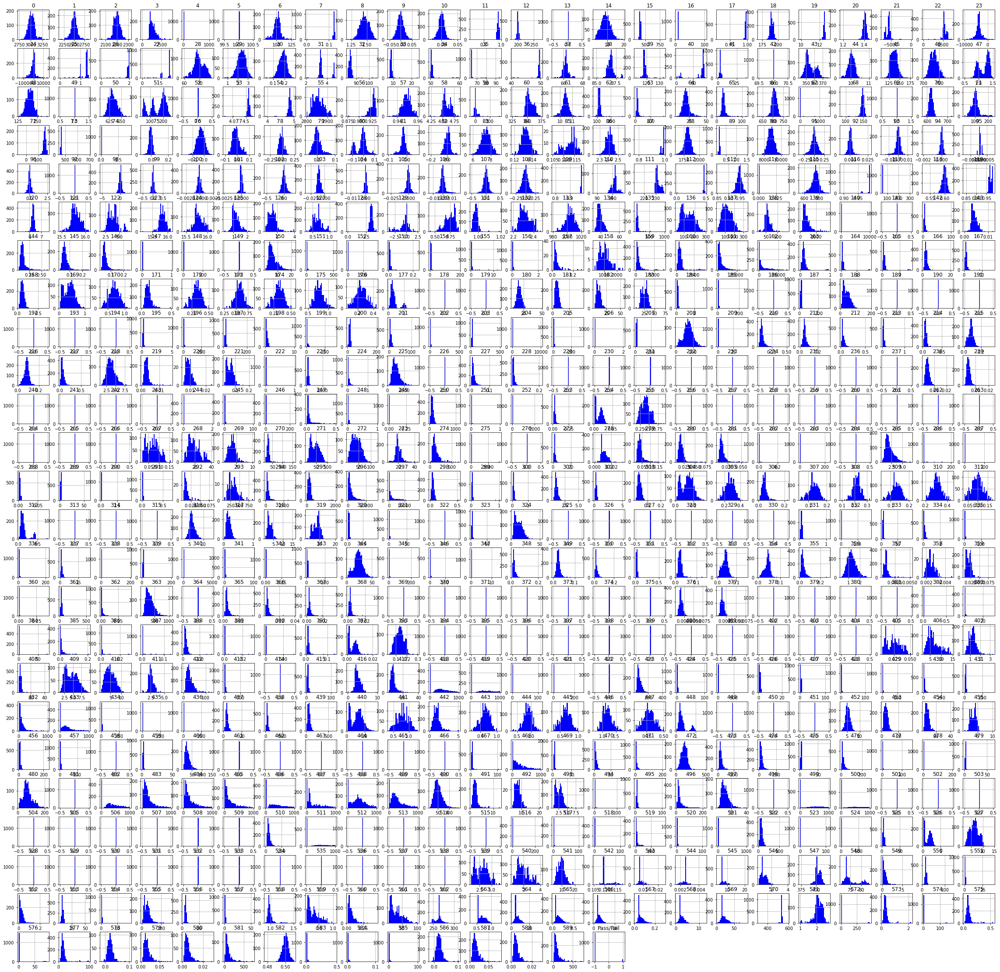

In [163]:
#plotting histogram to check for the frequency of values within a variable
df.hist(bins = 30, figsize = (40, 40), color = 'blue')
plt.show()

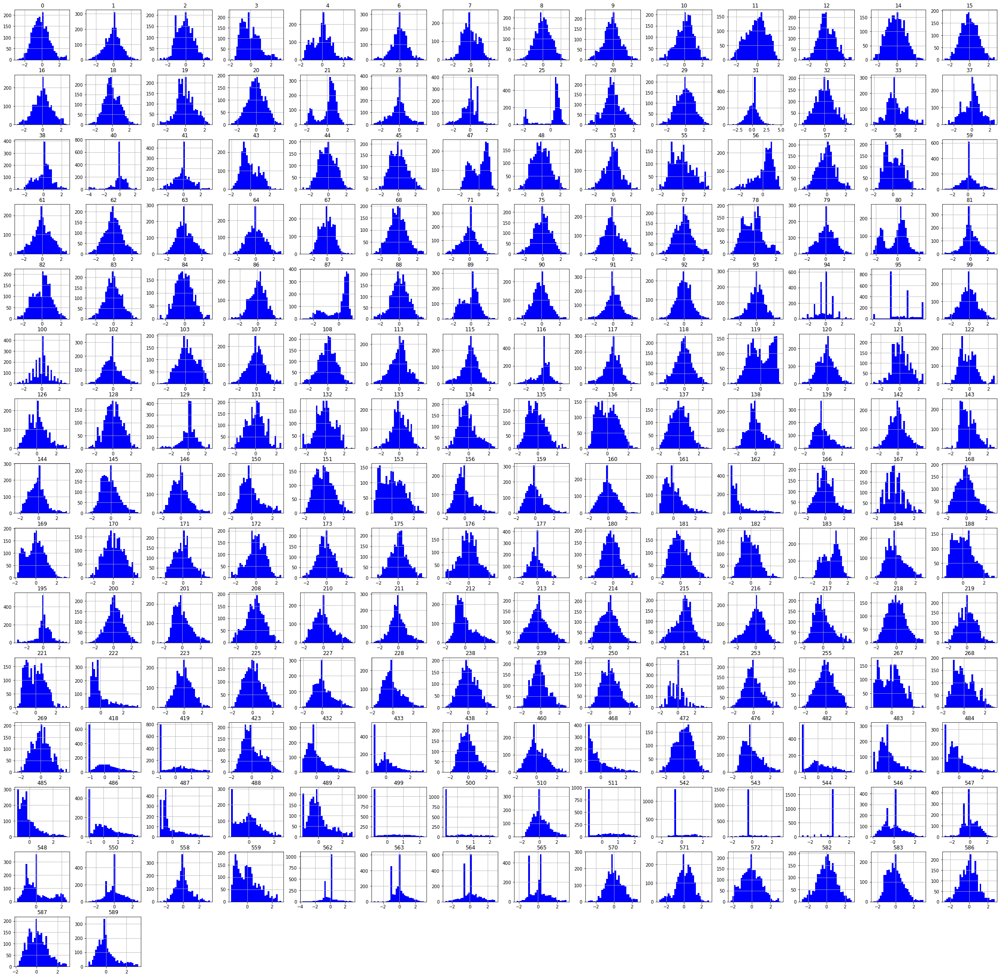

In [164]:
#plotting histogram to check for the frequency of values within a variable
X_train.hist(bins = 30, figsize = (40, 40), color = 'blue')
plt.show()

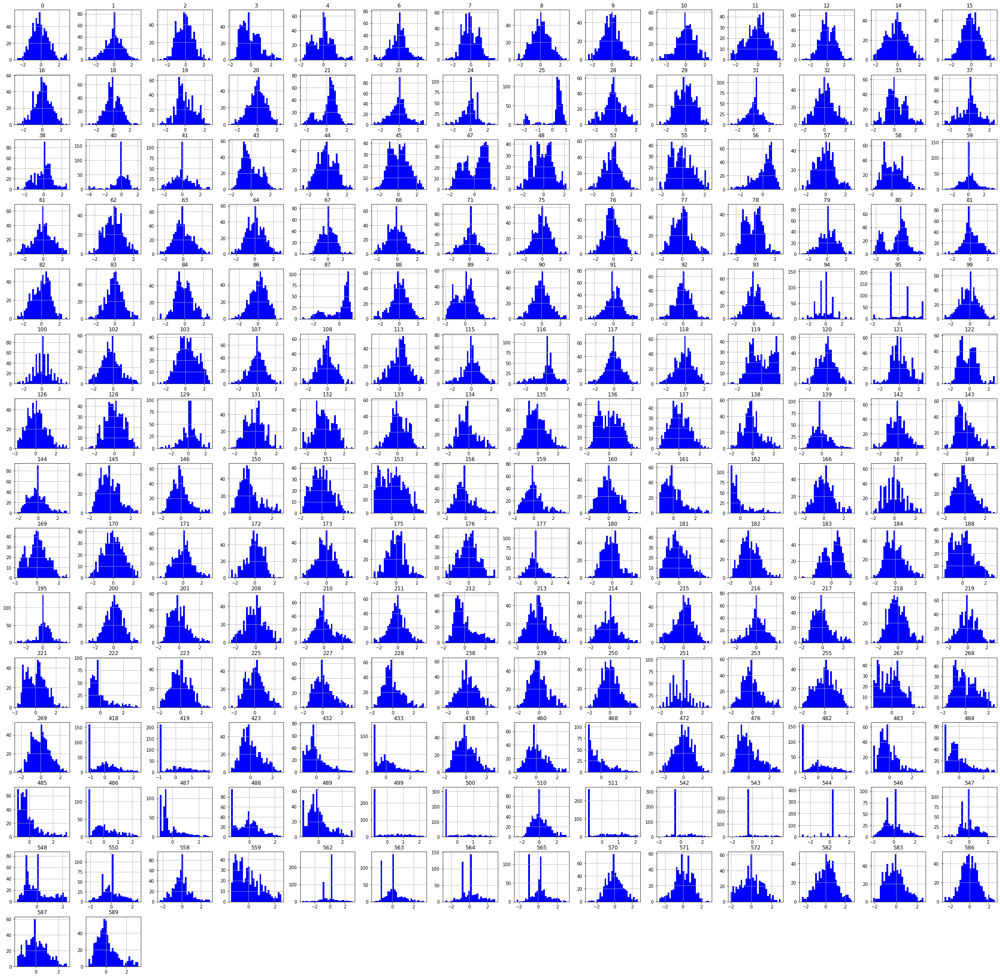

In [165]:
#plotting histogram to check for the frequency of values within a variable
X_test.hist(bins = 30, figsize = (40, 40), color = 'blue')
plt.show()

#### Observations:

1) The Train and the Test set have similar statistical characteristics when compared with Original data, for the features retained between the Original and the Scaled datasets.

2) Example, features 0, 1, 2, 3 have similar normal distributions between the Original and the Scaled datasets.

## 5.	Model training, testing and tuning: 

#### Training the dataset on XGBoost model due to it's ability to handle missing data and large datasets efficiently. Also, XGBoost model has the best combination of prediction performance and processing time compared to other algorithms like Random Forest, D-Tree, SVM.

In [166]:
# A.	Use any Supervised Learning technique to train a model. 
# Build and fit XGBoost Classification model
xgb_clas = XGBClassifier()
xgb_clas.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_bin=256, max_cat_threshold=64, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0, ...)

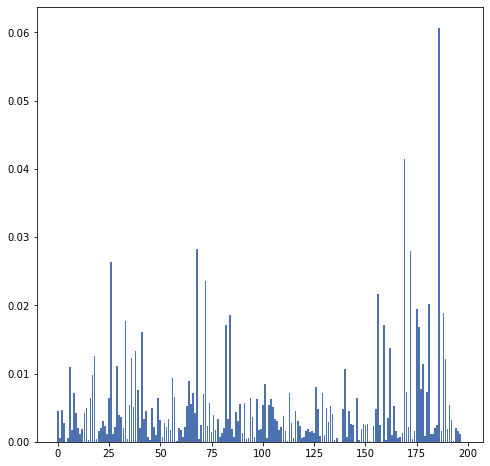

In [167]:
plt.bar(range(len(xgb_clas.feature_importances_)), xgb_clas.feature_importances_)
plt.show()

In [168]:
# Checking feature importance
eli5.show_weights(xgb_clas, top = 10, feature_names = X_train.columns.tolist())

Weight,Feature
0.0607,562
0.0415,486
0.0283,95
0.0280,489
0.0263,33
0.0235,103
0.0216,419
0.0202,547
0.0194,510
0.0189,564


In [169]:
# Make predictions on Train and Test data
y_train_pred = xgb_clas.predict(X_train)
y_test_pred = xgb_clas.predict(X_test)

In [170]:
# Classification Accuracy
print('XGB Classifier model accuracy')
print('*' * 50)
print('Training data accuracy: ', accuracy_score(y_train_pred, y_train))
print('Test data accuracy: ', accuracy_score(y_test_pred, y_test))

XGB Classifier model accuracy
**************************************************
Training data accuracy:  1.0
Test data accuracy:  0.9812286689419796


#### Observations:

1) The model gives a Training accuracy of 100% with a Test accuracy of 98.1% Let's try to tune the model further.

In [171]:
# B.	Use cross validation techniques. 

In [172]:
# kfold cross validation
num_folds = 10
kfold = KFold(n_splits = num_folds)
model = XGBClassifier()
results = cross_val_score(model, X_train, y_train, cv = kfold, scoring = 'accuracy')
print("k-Fold Training Accuracy: %.3f%% (%.3f%%)" % (results.mean()*100.0, results.std()*100.0))

k-Fold Training Accuracy: 98.632% (1.206%)


In [173]:
'''# Leave One Out cross validation
loocv = LeaveOneOut()
model = XGBClassifier()
results = cross_val_score(model, X_train, y_train, cv = loocv, n_jobs = -1)
mean(absolute(scores))'''

'# Leave One Out cross validation\nloocv = LeaveOneOut()\nmodel = XGBClassifier()\nresults = cross_val_score(model, X_train, y_train, cv = loocv, n_jobs = -1)\nmean(absolute(scores))'

### Note: Cell is taking to long to run

In [174]:
# C.	Apply hyper-parameter tuning techniques to get the best accuracy
# define the parameters for the model
params = {"n_estimators":[67,70,100,120], 'reg_lambda':[2,1], 'gamma':[0,0.3,0.2,0.1]
          , 'eta':[0.06,0.05,0.04], 'max_depth':[3,5], 'objective':['binary:logistic']}

In [175]:
# Build and fit XGBoost Classification model with RandomizedSearchCV
clf = RandomizedSearchCV(xgb_clas, params, cv = 10, n_jobs = -1, verbose = 1, scoring = 'accuracy')
clf.fit(X_train, y_train)

Fitting 10 folds for each of 10 candidates, totalling 100 fits


RandomizedSearchCV(cv=10,
                   estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                           callbacks=None, colsample_bylevel=1,
                                           colsample_bynode=1,
                                           colsample_bytree=1,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric=None, feature_types=None,
                                           gamma=0, gpu_id=-1,
                                           grow_policy='depthwise',
                                           importance_type=None,
                                           interaction_constraints='',
                                           learning_rate=0.30...
                                           max_leaves=0, min_child_weight=1,
                                           missing=nan,
                                           monotone_constraints='()',
                                           n_estimators=100, n_jobs=0,
                                           num_parallel_tree=1,
                                           predictor='auto', random_state=0, ...),
                   n_jobs=-1,
                   param_distributions={'eta': [0.06, 0.05, 0.04],
                                        'gamma': [0, 0.3, 0.2, 0.1],
                                        'max_depth': [3, 5],
                                        'n_estimators': [67, 70, 100, 120],
                                        'objective': ['binary:logistic'],
                                        'reg_lambda': [2, 1]},
                   scoring='accuracy', verbose=1)

In [176]:
# Print best hyper parameters set
print("Best Hyper Parameters for Model Training: ", clf.best_params_)

Best Hyper Parameters for Model Training:  {'reg_lambda': 2, 'objective': 'binary:logistic', 'n_estimators': 100, 'max_depth': 5, 'gamma': 0.3, 'eta': 0.05}


In [177]:
# A.	Use any Supervised Learning technique to train a model. 
# Build and fit XGBoost Classification model
xgb_clas_1 = XGBClassifier(reg_lambda= 1, objective= 'binary:logistic', n_estimators= 67, max_depth= 5, gamma= 0, eta= 0.04)
xgb_clas_1.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False, eta=0.04,
              eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.0399999991,
              max_bin=256, max_cat_threshold=64, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=5, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=67, n_jobs=0,
              num_parallel_tree=1, predictor='auto', ...)

In [178]:
# Checking feature importance
eli5.show_weights(xgb_clas_1, top = 10, feature_names = X_train.columns.tolist())

Weight,Feature
0.0350,486
0.0249,95
0.0247,103
0.0246,33
0.0229,562
0.0219,433
0.0208,419
0.0194,7
0.0189,126
0.0166,511


In [179]:
# Make predictions on Train and Test data
y_train_pred_1 = xgb_clas_1.predict(X_train)
y_test_pred_1 = xgb_clas_1.predict(X_test)

In [180]:
# Classification Accuracy
print('XGB Classifier hypertuned model accuracy')
print('*' * 50)
print('Training data accuracy: ', accuracy_score(y_train_pred_1, y_train))
print('Test data accuracy: ', accuracy_score(y_test_pred_1, y_test))

XGB Classifier hypertuned model accuracy
**************************************************
Training data accuracy:  0.9923076923076923
Test data accuracy:  0.9522184300341296


#### Observations:

1) The model gives a Training accuracy of 99.2% with a Test accuracy of 95.2% after hyper tuning the model.

In [181]:
# D.	Use any other technique/method which can enhance the model performance. 

#### Fetaure reduction and Feature selection

In [182]:
# Ridge regression model
ridge = Ridge(alpha=.3)
ridge.fit(X_train,y_train)
print ("Ridge model:", (ridge.coef_))

Ridge model: [[-5.52000515e-02 -4.61832771e-02 -1.03138667e-01  1.84079612e-02
   1.04751756e-02 -3.66243275e-02 -5.85752953e-02 -7.32310139e-04
  -2.14384889e-02  2.25406406e-02 -1.73077118e-02  4.54910239e-01
  -7.14407702e-02  1.10506348e-02 -7.35336868e-02 -4.67009894e-01
   5.77767517e-03  1.08478875e-02  5.33093525e-02 -2.70999564e-02
  -1.91703442e-02  5.42453960e-02 -5.39182188e-02 -2.57597681e-02
   4.59764411e-02  3.03581696e-02  2.54547162e-02 -3.75976925e-02
   3.76141498e-03 -1.41441183e-02 -3.55303396e-02  1.19067439e-01
   7.01157292e-03  6.69978456e-02  9.96834515e-03 -2.18266208e-02
  -5.76974424e-02  3.79917106e-02  1.32059838e-01  5.42041186e-03
   2.09401303e-02  7.09785688e-02 -1.64003289e-03 -5.32283268e-02
  -5.48483319e-02  1.37123976e-02 -1.96933384e-02 -2.09476762e-02
   4.61095614e-02  2.65035537e-02 -6.11586326e-03 -8.36136567e-03
  -4.75663118e-02 -6.53874091e-03  3.27731727e-03  5.20639035e-02
   4.64325476e-02 -2.62871160e-02 -1.55657931e-03  3.98536318e-

In [183]:
# Checking feature importance
eli5.show_weights(ridge, top = 10, feature_names = X_train.columns.tolist())

In [184]:
# Classification Accuracy
print('Ridge regularized model accuracy')
print('*' * 50)
print('Training data accuracy: ', ridge.score(X_train, y_train))
print('Test data accuracy: ',ridge.score(X_test, y_test))

Ridge regularized model accuracy
**************************************************
Training data accuracy:  0.5950251151000738
Test data accuracy:  0.4775995971848147


#### Observations:

1) The model gives a Training accuracy of 59.5% with a Test accuracy of 47.7% after feature reduction with Ridge regression.

In [185]:
# Lasso regression model
lasso = Lasso(alpha=0.1)
lasso.fit(X_train,y_train)
print ("Lasso model:", (lasso.coef_))

Lasso model: [-0.         -0.         -0.         -0.         -0.         -0.
 -0.          0.         -0.          0.         -0.         -0.
 -0.          0.          0.         -0.          0.          0.
  0.         -0.         -0.          0.         -0.         -0.
  0.          0.          0.          0.          0.         -0.
 -0.         -0.         -0.          0.          0.         -0.
 -0.         -0.          0.         -0.          0.          0.01178147
  0.         -0.          0.          0.         -0.         -0.
 -0.          0.         -0.         -0.         -0.          0.
 -0.          0.          0.         -0.         -0.          0.
  0.          0.         -0.         -0.          0.         -0.
  0.         -0.          0.         -0.          0.         -0.
  0.04222742  0.         -0.          0.         -0.         -0.
 -0.         -0.          0.         -0.          0.         -0.
  0.          0.          0.         -0.         -0.          0.
 -0.

In [186]:
# Checking feature importance
eli5.show_weights(lasso, top = 10, feature_names = X_train.columns.tolist())

Weight?,Feature
+0.489,<BIAS>
+0.042,103
+0.012,59


In [187]:
# Classification Accuracy
print('Lasso regularized model accuracy')
print('*' * 50)
print('Training data accuracy: ', lasso.score(X_train, y_train))
print('Test data accuracy: ', lasso.score(X_test, y_test))

Lasso regularized model accuracy
**************************************************
Training data accuracy:  0.051918182458409845
Test data accuracy:  0.05262224519383574


#### Observations:

1) The model gives a Training accuracy of 5.1% with a Test accuracy of 5.2% after feature reduction with Lasso regression, which signifies poor performnce.

#### Observations:

1) The Lasso model has almost equal performance on train and test datasets, when compared to Ridge.

2) Many of the coefficients have become 0 indicating drop of those dimensions from the Lasso model.

3) The Ridge Regression model has a higher Train-Test accuracy than Lasso Regression model. 

4) We can choose Ridge Regression for Feature Selection, since it explains the model using more features and the expected average output score of the model (+0.244) is closer to 0 when compared to Lasso(+0.489).

#### Building the final XGB Classifier model out of the reduced features selected using Ridge regression model using the ideal parameters combination.

In [188]:
# Create dataframe out of the Ridge features
XRidge = X_smote[['12','56','43','183','167','16','132','2','18']]

In [189]:
# Split X and y into Main and Test set in 80:20 ratio
X_train1, X_test1, y_train1, y_test1 = train_test_split(XRidge, y_smote, test_size = 0.20, random_state = 1)

In [190]:
# Build and fit XGBoost Classification model
xgb_clas_2 = XGBClassifier(reg_lambda= 1, objective= 'binary:logistic', n_estimators= 67, max_depth= 5, gamma= 0, eta= 0.04)
xgb_clas_2.fit(X_train1, y_train1)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False, eta=0.04,
              eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.0399999991,
              max_bin=256, max_cat_threshold=64, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=5, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=67, n_jobs=0,
              num_parallel_tree=1, predictor='auto', ...)

In [191]:
# Make predictions on Train and Test data
y_train_pred_2 = xgb_clas_2.predict(X_train1)
y_test_pred_2 = xgb_clas_2.predict(X_test1)

In [192]:
# Classification Accuracy
print('Ridge regularized XGB Classifier hypertuned model accuracy')
print('*' * 50)
print('Training data accuracy: ', accuracy_score(y_train_pred_2, y_train1))
print('Test data accuracy: ', accuracy_score(y_test_pred_2, y_test1))

Ridge regularized XGB Classifier hypertuned model accuracy
**************************************************
Training data accuracy:  0.9021367521367522
Test data accuracy:  0.8327645051194539


#### Observations:

1) The final model gives a Training accuracy of 90.2% with a Test accuracy of 83.2%.

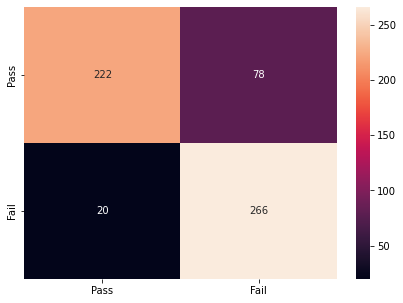

In [193]:
# Confusion Matrix 
cm = confusion_matrix(y_test1, y_test_pred_2, labels = [0, 1])

df_cm = pd.DataFrame(cm, index = [i for i in ["Pass","Fail"]],
                  columns = [i for i in ["Pass","Fail"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot = True , fmt = 'g')
plt.show()

In [194]:
# E.	Display and explain the classification report in detail
# Print the model performance metrics
print('Ridge regularized XGB Classifier hypertuned model accuracy')
print('-------------------------------------------------------')
print('Train performance')
print('-------------------------------------------------------')
print(classification_report(y_train1, y_train_pred_2))

print('Test performance')
print('-------------------------------------------------------')
print(classification_report(y_test1, y_test_pred_2))

print('Roc_auc score')
print('-------------------------------------------------------')
print(roc_auc_score(y_test1, y_test_pred_2))
print('')

Ridge regularized XGB Classifier hypertuned model accuracy
-------------------------------------------------------
Train performance
-------------------------------------------------------
              precision    recall  f1-score   support

           0       0.97      0.83      0.89      1163
           1       0.85      0.97      0.91      1177

    accuracy                           0.90      2340
   macro avg       0.91      0.90      0.90      2340
weighted avg       0.91      0.90      0.90      2340

Test performance
-------------------------------------------------------
              precision    recall  f1-score   support

           0       0.92      0.74      0.82       300
           1       0.77      0.93      0.84       286

    accuracy                           0.83       586
   macro avg       0.85      0.84      0.83       586
weighted avg       0.85      0.83      0.83       586

Roc_auc score
-------------------------------------------------------
0.835034965034

#### Observations:

1) In our dataset we have, Pass = 0, Failure = 1

2) Therefore, TP = Number of Failures and TN = Number of Passes

3) Hence, we need to look at metrics like Precision and Recall to analyze the model performance

4) The Precision for Failures in Test set is 77%, which is a measure of quality of the correct predictions

5) The Recall for Failures in Test set is 93%, which is a measure of quantity of the correct predictions

6) The ROC AUC score for the model is 83.5%, which tells how much the model is capable of distinguishing between the classes

In [195]:
# F.	Apply the above steps for all possible models that you have learnt so far
# initializing all the Classification models
LogR_model = LogisticRegression()
KNN_model = KNeighborsClassifier(n_neighbors = 5)
GN_model = GaussianNB()
svc_model_rbf = SVC(kernel = 'rbf')
dec_tree_model = DecisionTreeClassifier()
xgb_clas_model = XGBClassifier(reg_lambda= 1, objective= 'binary:logistic', n_estimators= 67, max_depth= 5, gamma= 0, eta= 0.04)

LogR: 0.615538 (0.030076)
KNN: 0.838682 (0.016716)
NB: 0.625778 (0.020874)
SVM-rbf: 0.842105 (0.019423)
D-Tree: 0.828114 (0.022517)
XGBoost: 0.853052 (0.021416)


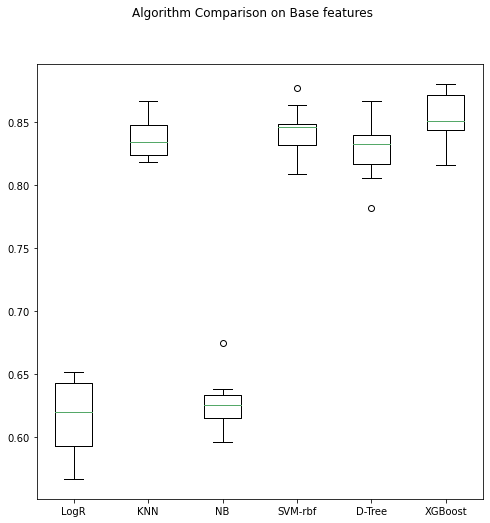

In [196]:
# Algorithm Comparison on Base features
seed = 1

# prepare models
models = []
models.append(('LogR', LogR_model))
models.append(('KNN', KNN_model))
models.append(('NB', GN_model))
models.append(('SVM-rbf', svc_model_rbf))
models.append(('D-Tree', dec_tree_model))
models.append(('XGBoost', xgb_clas_model))

# evaluate each model in turn
results = []
names = []
scoring = 'accuracy'
for name, model in models:
    kfold = model_selection.KFold(n_splits = 10, random_state = seed, shuffle = True)
    cv_results = model_selection.cross_val_score(model, XRidge, y_smote, cv = kfold, scoring = scoring)
    results.append(cv_results)
    names.append(name)
    msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
    print(msg)
    
# boxplot algorithm comparison
fig = plt.figure()
fig.suptitle('Algorithm Comparison on Base features')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()

## 6.	Post Training and Conclusion: 

In [197]:
# A.	Display and compare all the models designed with their train and test accuracies. 

In [198]:
'''cv = ShuffleSplit(n_splits=100, test_size=0.2, random_state=42)
learning_curve(xgb_clas, xgb_clas_1, xgb_clas_2, X_train, y_train, (0.87, 1.01), cv=cv, n_jobs=4)'''

'cv = ShuffleSplit(n_splits=100, test_size=0.2, random_state=42)\nlearning_curve(xgb_clas, xgb_clas_1, xgb_clas_2, X_train, y_train, (0.87, 1.01), cv=cv, n_jobs=4)'

In [199]:
# B.	Select the final best trained model along with your detailed comments for selecting this model. 

#### Observations:

1) We can select the XGBoost Classifier as the final algorithm since it has the highest model accuracy of 0.853052%(0.021416)

2) The model performance order is, XGBoost > SVM > KNN > D-Tree > Naive Bayes > Logistic Regression

In [200]:
# C.	Pickle the selected model for future use. 
# save the model to disk
filename = 'finalized_model.sav'
pickle.dump(xgb_clas_2, open(filename, 'wb'))

In [201]:
# load the model from disk
loaded_model = pickle.load(open(filename, 'rb'))
result = loaded_model.score(XRidge, y_smote)
print(result)

0.8882433356117566


In [202]:
# D.	Write your conclusion on the results. 

#### Observations:

1) The original dataframe consists of 1567 examples of recordings from 590 sensors in a semiconductor manufacturing plant each with a label of PASS or FAIL.It did not have labels for any of the features we could use to derive meaning from data.

2) The data volume was recorded over the period of an entire year in which the production happened 24/7 throughout the year and we saw a peak durig the months of August and September.

3) The dataframe had its share of faulty values and null recordings which we had to impute or drop. 

4) There was also a huge class imbalance in the dataset which we had to balance using synthetic oversampling techniques.

5) The dataset exhibited high collinearity and multicollinearity. This might indicate that we may not need sensors at every stage of the production process because they might be recording redundant repititive data. This can be a possible solution of cost control as well.

6) A labelled dataset would have helpful to get a feel of the feature importance and to identify critical points in the entire manufacturing process. 

7) From 589 sensor data, we trimmed down to 10 sensors to build the final XGBoost Classifier model, with a test accuracy of 0.853052 (0.021416).

## End of Project